In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

import networkx as nx

%matplotlib inline
pd.set_option('max_columns',None)
import warnings
warnings.filterwarnings('ignore')

### Airports

https://openflights.org/data.html

As of January 2017, the OpenFlights Airports Database contains over 10,000 airports, train stations and ferry terminals spanning the globe, as shown in the map above. Each entry contains the following information: 

__Airport ID__ Unique OpenFlights identifier for this airport.  
__Name__	Name of airport. May or may not contain the City name.  
__City__	Main city served by airport. May be spelled differently from Name.  
__Country__	Country or territory where airport is located. See Countries to cross-reference to ISO 3166-1 codes.  
__IATA__	3-letter IATA code. Null if not assigned/unknown.   
__ICAO__	4-letter ICAO code. Null if not assigned.   
__Latitude__	Decimal degrees, usually to six significant digits. Negative is South, positive is North.   
__Longitude__	Decimal degrees, usually to six significant digits. Negative is West, positive is East.   
__Altitude__	In feet.   
__Timezone__	Hours offset from UTC. Fractional hours are expressed as decimals, eg. India is 5.5.   
__DST__	Daylight savings time. One of E (Europe), A (US/Canada), S (South America), O (Australia), Z (New Zealand), N (None) or U (Unknown). See also: Help: Time   
__Tz database time zone__	Timezone in "tz" (Olson) format, eg. "America/Los_Angeles".   
__Type__ Type of the airport. Value "airport" for air terminals, "station" for train stations, "port" for ferry terminals and "unknown" if not known. In airports.csv, only type=airport is included.   
__Source__	Source of this data. "OurAirports" for data sourced from OurAirports, "Legacy" for old data not matched to OurAirports (mostly DAFIF), "User" for unverified user contributions. In airports.csv, only source=OurAirports is included.   
  
The data is UTF-8 encoded. 

__Notes:__   
Rules for daylight savings time change from year to year and from country to country. \
The current data is an approximation for 2009, built on a country level. Most airports in DST-less regions in countries that generally observe DST (eg. AL, HI in the USA, NT, QL in Australia, parts of Canada) are marked incorrectly.

In [2]:
# import from github - have to manually add header
airports = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat',
                      sep=',',
                      header=None,
                      names=['airport_id',
                            'name',
                            'city',
                            'country',
                            'IATA',
                            'ICAO',
                            'latitude',
                            'longitude',
                            'altitude',
                            'timezone',
                            'DST',
                             'Tz_database_timezone',
                             'type',
                             'source'
                            ])

# US only
airports = airports[airports.country == 'United States']

# Drop \N (null) - Their null values = '\N' which is a python expression and makes it difficult to get rid of
airports = airports.replace(r'\\N','NULL', regex=True)
airports = airports[airports.IATA != 'NULL']

airports.head()

,airport_id,name,city,country,IATA,ICAO,latitude,longitude,altitude,timezone,DST,Tz_database_timezone,type,source
3212,3411,Barter Island LRRS Airport,Barter Island,United States,BTI,PABA,70.134003,-143.582001,2,-9,A,America/Anchorage,airport,OurAirports
3214,3413,Cape Lisburne LRRS Airport,Cape Lisburne,United States,LUR,PALU,68.875099,-166.110001,16,-9,A,America/Anchorage,airport,OurAirports
3215,3414,Point Lay LRRS Airport,Point Lay,United States,PIZ,PPIZ,69.732903,-163.005005,22,-9,A,America/Anchorage,airport,OurAirports
3216,3415,Hilo International Airport,Hilo,United States,ITO,PHTO,19.721399,-155.048004,38,-10,N,Pacific/Honolulu,airport,OurAirports
3217,3416,Orlando Executive Airport,Orlando,United States,ORL,KORL,28.545500,-81.332901,113,-5,A,America/New_York,airport,OurAirports


### Bureau of Transportation Statistics - Flights

https://www.transtats.bts.gov/DL_SelectFields.asp?Table_ID=236&DB_Short_Name=On-Time

__YEAR__ Year  
__QUARTER__ Quarter  
__MONTH__ Month  
__DAY_OF_MONTH__ Day of month  
__DAY_OF_WEEK__ Day of week  
__FL_DATE__ yyyy-mm-dd  
__ORIGIN_AIRPORT_ID__ Origin Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused.  
__ORIGIN__ Origin Airport  
__ORIGIN_CITY_NAME__ Origin Airport, City Name  
__ORIGIN_STATE_ABR__ Origin Airport, State Code  
__ORIGIN_STATE_FIPS__ Origin Airport, State Fips  
__ORIGIN_STATE_NM__ Origin Airport, State Name  
__ORIGIN_WAC__ Origin Airport, World Area Code  
__DEST_AIRPORT_ID__ 	Destination Airport, Airport ID. An identification number assigned by US DOT to identify a unique airport. Use this field for airport analysis across a range of years because an airport can change its airport code and airport codes can be reused.  
__DEST__ 	Destination Airport  
__DEST_CITY_NAME__ Destination Airport, City Name  
__DEST_STATE_ABR__ Destination Airport, State Code  
__DEST_STATE_FIPS__ Destination Airport, State Fips   
__DEST_STATE_NM__ Destination Airport, State Name  
__DEST_WAC__ Destination Airport, World Area Code  
__DEP_DELAY__ Difference in minutes between scheduled and actual departure time

In [3]:
columns = ['YEAR', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK', 'FL_DATE',
           'ORIGIN_AIRPORT_ID', 'ORIGIN', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR',
           'ORIGIN_STATE_FIPS', 'ORIGIN_STATE_NM', 'ORIGIN_WAC', 'DEST_AIRPORT_ID',
           'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_STATE_FIPS',
           'DEST_STATE_NM', 'DEST_WAC', 'DEP_DELAY']

# JAN 2020 flights
flights_202001 = pd.read_csv('202001_T_ONTIME_REPORTING.csv', usecols=columns)

# FEB 2020 flights
flights_202002 = pd.read_csv('202002_T_ONTIME_REPORTING.csv', usecols=columns)

# MAR 2020 Flights
flights_202003 = pd.read_csv('202003_T_ONTIME_REPORTING.csv',usecols=columns)

# combine jan and feb
flights = pd.concat([flights_202001,flights_202002]) 

# add mar
flights = pd.concat([flights,flights_202003]) 

flights.FL_DATE = pd.to_datetime(flights.FL_DATE)

flights.head()

,YEAR,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,ORIGIN_AIRPORT_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,DEP_DELAY
0,2020,1,1,3,2020-01-01,13891,ONT,"Ontario, CA",CA,6,California,91,14771,SFO,"San Francisco, CA",CA,6,California,91,41.0
1,2020,1,1,3,2020-01-01,13891,ONT,"Ontario, CA",CA,6,California,91,14771,SFO,"San Francisco, CA",CA,6,California,91,-4.0
2,2020,1,1,3,2020-01-01,13891,ONT,"Ontario, CA",CA,6,California,91,14831,SJC,"San Jose, CA",CA,6,California,91,-4.0
3,2020,1,1,3,2020-01-01,13891,ONT,"Ontario, CA",CA,6,California,91,14831,SJC,"San Jose, CA",CA,6,California,91,10.0
4,2020,1,1,3,2020-01-01,13891,ONT,"Ontario, CA",CA,6,California,91,14831,SJC,"San Jose, CA",CA,6,California,91,1.0


### Exploratory Analysis

In [40]:
# Number of airports and flights
print('Count of unique airports:',airports.IATA.nunique())
print('Count of unique flights:',len(flights))

Count of unique airports: 1251
Count of unique flights: 1829847


In [48]:
# What was the max delay?
date = flights.FL_DATE[flights.DEP_DELAY == flights.DEP_DELAY.max()].values
origin = flights.ORIGIN[flights.DEP_DELAY == flights.DEP_DELAY.max()].values
dest = flights.DEST[flights.DEP_DELAY == flights.DEP_DELAY.max()].values
delay = flights.DEP_DELAY.max()
print('Flight on {} originiating at {} going to {}, had the longest delay of {}' \
      .format(date,origin,dest,delay))

Flight on ['2020-02-19T00:00:00.000000000'] originiating at ['STT'] going to ['CLT'], had the longest delay of 2814.0


In [51]:
# Count of on-time/early flights and delayed flights
print('Count of on-time/early flights during JAN-MAR 2020:',
      flights.DEP_DELAY[flights.DEP_DELAY <= 0].count())
print('Count of delayed flights during JAN-MAR 2020:',
      flights.DEP_DELAY[flights.DEP_DELAY > 0].count())

Count of on-time/early flights during JAN-MAR 2020: 1281119
Count of delayed flights during JAN-MAR 2020: 427118


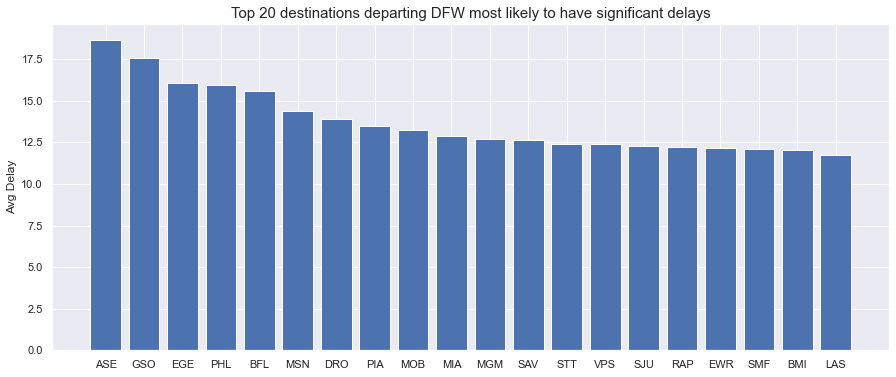

In [79]:
# Which flights departing DFW are most likely to have significant delays?
DFW_delays = flights[flights.ORIGIN == 'DFW'].groupby(['ORIGIN','DEST'], as_index=False)['DEP_DELAY'] \
.mean() \
.sort_values(by='DEP_DELAY', ascending=False) \
.rename(columns={'DEP_DELAY':'AVG_DEP_DELAY'})

plt.figure(figsize=(15,6))
plt.bar(DFW_delays.DEST[:20], DFW_delays.AVG_DEP_DELAY[:20])
plt.title('Top 20 destinations departing DFW most likely to have significant delays',fontsize=15)
plt.ylabel('Avg Delay')
plt.show()

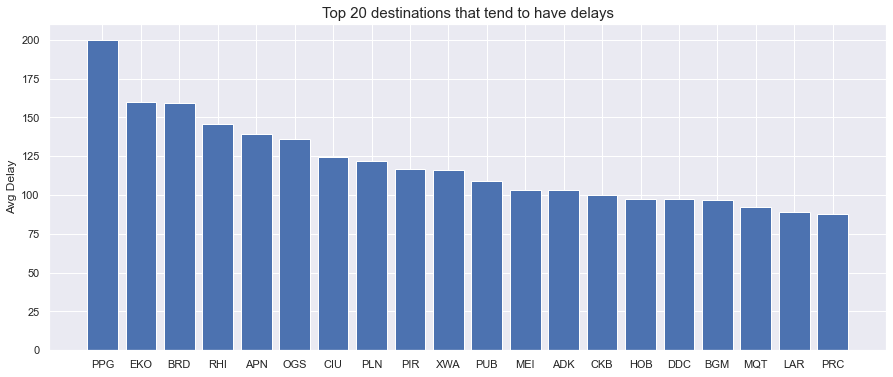

In [85]:
# Which destinations tend to have delays?
dest_delays = flights[flights.DEP_DELAY > 0].groupby('DEST', as_index=False)['DEP_DELAY'].mean() \
.rename(columns={'DEP_DELAY':'AVG_DEP_DELAY'}).sort_values(by='AVG_DEP_DELAY', ascending=False)

plt.figure(figsize=(15,6))
plt.bar(dest_delays.DEST[:20], dest_delays.AVG_DEP_DELAY[:20])
plt.title('Top 20 destinations that tend to have delays',fontsize=15)
plt.ylabel('Avg Delay')
plt.show()

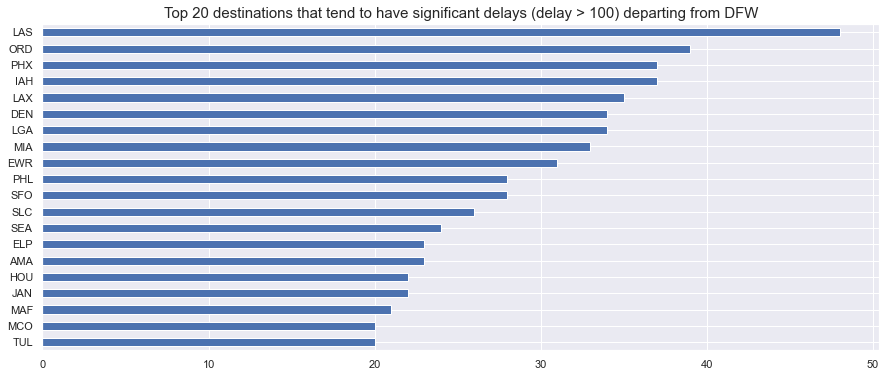

In [115]:
# Which destinations tend to have significant delays (delay > 100) departing from DFW
plt.figure(figsize=(15,6))
flights.DEST[(flights.ORIGIN == 'DFW')&(flights.DEP_DELAY >= 100)].value_counts()[:20].plot(kind='barh')
plt.gca().invert_yaxis()
plt.title('Top 20 destinations that tend to have significant delays (delay > 100) departing from DFW',
          fontsize=15)
plt.show()

### Nodes

In [116]:
# unique airports
trip_nodes = pd.DataFrame({'id':airports.IATA.unique()})

print(trip_nodes.shape)
trip_nodes.head()

(1251, 1)


,id
0,BTI
1,LUR
2,PIZ
3,ITO
4,ORL


### Edges

In [117]:
# flights
trip_edges = pd.DataFrame({
                           'trip_id':flights.index,
                           'source':flights.ORIGIN,
                           'source_city':flights.ORIGIN_CITY_NAME,
                           'source_state_name':flights.ORIGIN_STATE_NM,
                           'dest':flights.DEST,
                           'dest_city':flights.DEST_CITY_NAME,
                           'dest_state_name':flights.DEST_STATE_NM,
                           'weight':flights.DEP_DELAY
                          })

print(trip_edges.shape)
trip_edges.head()

(1829847, 8)


,trip_id,source,source_city,source_state_name,dest,dest_city,dest_state_name,weight
0,0,ONT,"Ontario, CA",California,SFO,"San Francisco, CA",California,41.0
1,1,ONT,"Ontario, CA",California,SFO,"San Francisco, CA",California,-4.0
2,2,ONT,"Ontario, CA",California,SJC,"San Jose, CA",California,-4.0
3,3,ONT,"Ontario, CA",California,SJC,"San Jose, CA",California,10.0
4,4,ONT,"Ontario, CA",California,SJC,"San Jose, CA",California,1.0


### Create Graph From Pandas

In [158]:
# create graph from pandas dataframes
import networkx as nx

# edges
G = nx.from_pandas_edgelist(trip_edges, # df
                            source='source', 
                            target='dest', 
                            edge_attr=True, # adding other columns
                            create_using=nx.DiGraph() # type of graph to create
                           )

# nodes
nx.set_node_attributes(G, trip_nodes)

# checking if graph is weighted
print('Is graph weighted:',nx.is_weighted(G))

Is graph weighted: True


### Graph Data to DF

In [159]:
# to dataframe
graph_df = pd.DataFrame(dict(
    DEGREE = dict(G.degree),
    DEGREE_CENTRALITY = nx.degree_centrality(G),
    EIGENVECTOR = nx.eigenvector_centrality(G),
    KATZ = nx.katz_centrality_numpy(G),
    CLOSENESS_CENTRALITY = nx.closeness_centrality(G),
    BETWEENNESS_CENTRALITY = nx.betweenness_centrality(G),
    CLUSTCOEF = nx.clustering(G)
)).reset_index() 

graph_df.rename(columns={'index':'NODE'}, inplace=True)

graph_df.head()

,NODE,DEGREE,DEGREE_CENTRALITY,EIGENVECTOR,KATZ,CLOSENESS_CENTRALITY,BETWEENNESS_CENTRALITY,CLUSTCOEF
0,ONT,38,0.107955,0.049603,0.017948,0.481532,0.000046,0.906433
1,SFO,163,0.463068,0.131295,0.005769,0.549142,0.020561,0.347660
2,SJC,85,0.241477,0.087499,-0.018826,0.514620,0.001206,0.609410
3,SMF,70,0.198864,0.079194,0.022120,0.507937,0.000666,0.702521
4,ORF,52,0.147727,0.067373,-0.022110,0.495077,0.000884,0.723077


### Airport Pagerank - Finding The Most Important Airports

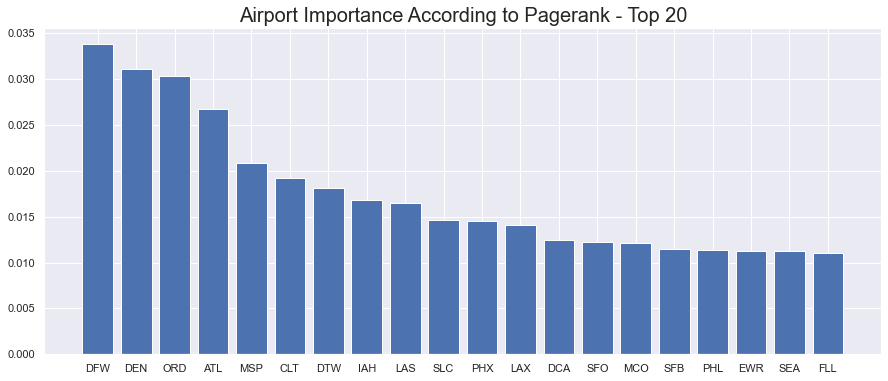

,airport,pagerank
0,DFW,0.033849
1,DEN,0.031131
2,ORD,0.030324
3,ATL,0.026720
4,MSP,0.020871


In [160]:
# edges
G_pr = nx.from_pandas_edgelist(trip_edges.drop(columns='weight'), # weight breaks PageRank
                            source='source', 
                            target='dest', 
                            edge_attr=True, # adding other columns
                            create_using=nx.DiGraph() # type of graph to create
                           )

# nodes
nx.set_node_attributes(G_pr, trip_nodes)

# pagerank 
pr = nx.pagerank(G_pr)

# convert to dataframe and sort
pr_df = pd.DataFrame(pr.items(), 
                     columns=['airport', 'pagerank']).sort_values(by='pagerank',ascending=False)
pr_df.index = range(0,len(pr_df))

# plot
plt.subplots(figsize=(15,6))
plt.bar(pr_df.airport[:20], pr_df.pagerank[:20])
plt.title('Airport Importance According to Pagerank - Top 20', fontsize=20)
plt.show()

pr_df.head()

### Graph Visualization
1. Node size and color represented by airport PageRank
2. Edge color represnted by weight (average airport delay)

Plotting graph with spring layout...


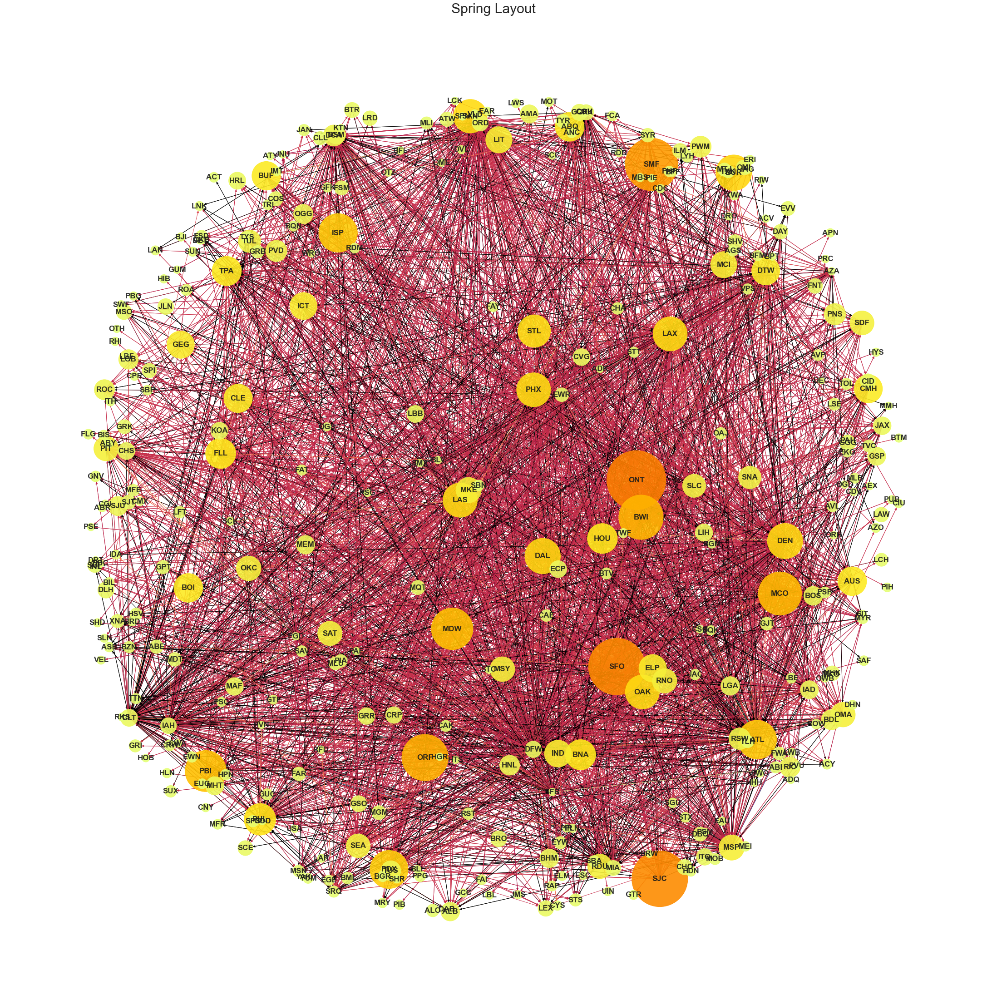

Plotting graph with kamada kawai layout...


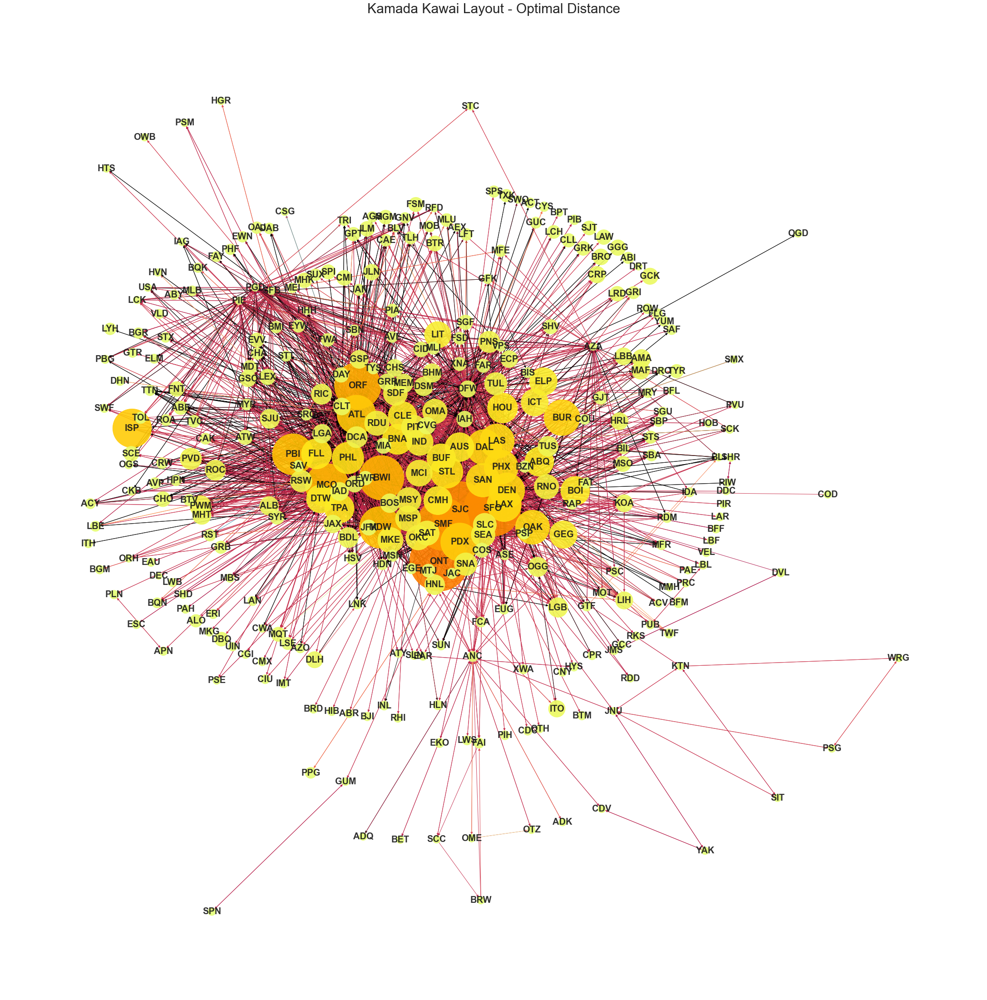

In [121]:
# node customization
val_map = dict(pr_df.values)
values = [val_map.get(node, 0.25) for node in list(pr_df.airport)]
node_list = list(pr_df.airport)
node_size = list(pr_df.pagerank * 500000) # pagerank multiplied for visualization purposes

# edge customization
edges, weights = zip(*nx.get_edge_attributes(G,'weight').items())

# spring layout graph
plt.figure(figsize=(30,30))

# graph layout
pos = nx.spring_layout(G,
                       k=1,
                       iterations=50
                      )

print('Plotting graph with spring layout...')
nx.draw(G,
        pos=pos,
        # nodes
        cmap=plt.cm.Wistia,
        node_color=values,
        node_list=node_list, 
        node_size=node_size,
        with_labels=True,
        font_weight='bold',
        font_size=17,
        alpha=0.9,
        # edges
        edgelist=edges, 
        edge_color=weights, 
        edge_cmap=plt.cm.Spectral,
        width=1
       )

ax = plt.gca()
plt.title('Spring Layout', fontsize=30)
plt.show()

# Optimal distance kamada_kawai_layout
plt.figure(figsize=(30,30))

# graph layout
a = pd.DataFrame(index=G.nodes(), columns=G.nodes())
for row, data in nx.shortest_path_length(G):
    for col, dist in data.items():
        a.loc[row,col] = dist
a = a.fillna(a.max().max())
layout = nx.kamada_kawai_layout(G, dist=a.to_dict())

print('Plotting graph with kamada kawai layout...')
nx.draw(G,
        pos=layout,
        # nodes
        cmap=plt.cm.Wistia,
        node_color=values,
        node_list=node_list, 
        node_size=node_size,
        with_labels=True,
        font_weight='bold',
        font_size=20,
        alpha=0.9,
        # edges
        edgelist=edges, 
        edge_color=weights, 
        edge_cmap=plt.cm.Spectral,
        width=1
       )

ax = plt.gca()
plt.title('Kamada Kawai Layout - Optimal Distance', fontsize=30)
plt.show()

### Shortest Path Route
A person starting at DFW needs to fly to YAK (no direct filghts). What is the optimal route?

In [259]:
import bellmanford as bf

print('Shortest path to get from DFW to YAK:',
      bf.bellman_ford(G, source='DFW', target='YAK', weight=None)[1])

Shortest path to get from DFW to YAK: ['DFW', 'SEA', 'JNU', 'YAK']


### Distribution Center Selection
A company has distribution centers in Atlanta (ATL), Dallas (DFW), and Los Angeles (LAX) and wants to select the optimal distribution center to ship a product

In [268]:
def dist_selector(G, sources, target):
    path = nx.multi_source_dijkstra_path(G, weight=None, sources=sources)
    return print('Target: {} \n Distribution Center: {} \n Optimized route: {}' \
                 .format(target,path[target][0],path[target]))

dist_selector(G, sources=['DFW','ATL','LAX'], target='JNU')

Target: JNU 
 Distribution Center: DFW 
 Optimized route: ['DFW', 'SEA', 'JNU']
